In [1]:
#Lead Score Case study
## Problem Statement
###An education company named X Education sells online courses to industry professionals. On any given day, many professionals who are interested in the courses land on their website and browse for courses.
###X Education needs to select the most promising leads, i.e. the leads that are most likely to convert into paying customers. The company requires to build a model in which person can assign a lead score to each of the leads such that the customers with higher lead score have a higher conversion chance and the customers with lower lead score have a lower conversion chance. The CEO, in particular, has given a ballpark of the target lead conversion rate to be around 80%.

##Goal and Objective
###Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.
###There are some more problems presented by the company which your model should be able to adjust to if the company's requirement changes in the future so you will need to handle these as well. These problems are provided in a separate doc file. Please fill it based on the logistic regression model you got in the first step. Also, make sure you include this in your final PPT where you'll make recommendations.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Importing data Set
df = pd.read_csv("Leads.csv")
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [4]:
df.shape

(9240, 37)

In [5]:
df.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [7]:
# Check if there are any duplicate values in the given dataset

df[df.duplicated(keep=False)]

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity


In [8]:
# Replacing 'Select' with NaN
df = df.applymap(lambda s:s.lower() if type(s) == str else s)
df = df.replace('select',np.nan)

In [9]:
df.isnull().sum()

Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   3380
How did you hear about X Education               7250
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

In [10]:
# We have some columns having Unique values and that type of columns are useless for our analysis
df.nunique()

Prospect ID                                      9240
Lead Number                                      9240
Lead Origin                                         5
Lead Source                                        20
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        41
Total Time Spent on Website                      1731
Page Views Per Visit                              114
Last Activity                                      17
Country                                            38
Specialization                                     18
How did you hear about X Education                  9
What is your current occupation                     6
What matters most to you in choosing a course       3
Search                                              2
Magazine                                            1
Newspaper Article           

In [11]:
# Removing Columns which have unique values

df= df.drop(['Magazine','Receive More Updates About Our Courses','Update me on Supply Chain Content','Get updates on DM Content','I agree to pay the amount through cheque'],axis=1)

In [12]:
round(df.isnull().sum()/len(df.index),2)*100

Prospect ID                                       0.0
Lead Number                                       0.0
Lead Origin                                       0.0
Lead Source                                       0.0
Do Not Email                                      0.0
Do Not Call                                       0.0
Converted                                         0.0
TotalVisits                                       1.0
Total Time Spent on Website                       0.0
Page Views Per Visit                              1.0
Last Activity                                     1.0
Country                                          27.0
Specialization                                   37.0
How did you hear about X Education               78.0
What is your current occupation                  29.0
What matters most to you in choosing a course    29.0
Search                                            0.0
Newspaper Article                                 0.0
X Education Forums          

In [13]:
# Removing Columns those having percentage of missing value greater than 35% addition to this removing 'Lead Profile','How did you hear about X Education','City','Lead Number','Prospect ID' as these columns doesn't contain useful values 
df1= df.drop(['Tags','Lead Quality','Asymmetrique Profile Index','Asymmetrique Activity Index','Asymmetrique Activity Score','Asymmetrique Profile Score','Lead Profile','How did you hear about X Education','City','Lead Number','Prospect ID'],axis=1)
df1.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,...,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,A free copy of Mastering The Interview,Last Notable Activity
0,api,olark chat,no,no,0,0.0,0,0.0,page visited on website,NaN,...,unemployed,better career prospects,no,no,no,no,no,no,no,modified
1,api,organic search,no,no,0,5.0,674,2.5,email opened,india,...,unemployed,better career prospects,no,no,no,no,no,no,no,email opened
2,landing page submission,direct traffic,no,no,1,2.0,1532,2.0,email opened,india,...,student,better career prospects,no,no,no,no,no,no,yes,email opened
3,landing page submission,direct traffic,no,no,0,1.0,305,1.0,unreachable,india,...,unemployed,better career prospects,no,no,no,no,no,no,no,modified
4,landing page submission,google,no,no,1,2.0,1428,1.0,converted to lead,india,...,unemployed,better career prospects,no,no,no,no,no,no,no,modified


In [14]:
round(100*(df1.isnull().sum()/len(df1.index)), 2)

Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   36.58
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Advertisement                             0.00
Through Re

In [15]:
#Filling 'Country' 'specialization' 'What is your current occupation' 'What matters most to you in choosing a course' Columns missing Values

df1['Country'] = df1['Country'].fillna('no info')
df1['Specialization'] = df1['Specialization'].fillna('no info') 
df1['What is your current occupation'] = df1['What is your current occupation'].fillna('no info')
df1['What matters most to you in choosing a course'] = df1['What matters most to you in choosing a course'].fillna('no info')
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 21 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9204 non-null   object 
 2   Do Not Email                                   9240 non-null   object 
 3   Do Not Call                                    9240 non-null   object 
 4   Converted                                      9240 non-null   int64  
 5   TotalVisits                                    9103 non-null   float64
 6   Total Time Spent on Website                    9240 non-null   int64  
 7   Page Views Per Visit                           9103 non-null   float64
 8   Last Activity                                  9137 non-null   object 
 9   Country                                        9240 

In [16]:
round(100*(df1.isnull().sum()/len(df1.index)), 2)

Lead Origin                                      0.00
Lead Source                                      0.39
Do Not Email                                     0.00
Do Not Call                                      0.00
Converted                                        0.00
TotalVisits                                      1.48
Total Time Spent on Website                      0.00
Page Views Per Visit                             1.48
Last Activity                                    1.11
Country                                          0.00
Specialization                                   0.00
What is your current occupation                  0.00
What matters most to you in choosing a course    0.00
Search                                           0.00
Newspaper Article                                0.00
X Education Forums                               0.00
Newspaper                                        0.00
Digital Advertisement                            0.00
Through Recommendations     

In [17]:
df1["Country"].value_counts()

india                   6492
no info                 2461
united states             69
united arab emirates      53
singapore                 24
saudi arabia              21
united kingdom            15
australia                 13
qatar                     10
bahrain                    7
hong kong                  7
oman                       6
france                     6
unknown                    5
kuwait                     4
south africa               4
canada                     4
nigeria                    4
germany                    4
sweden                     3
philippines                2
uganda                     2
italy                      2
bangladesh                 2
netherlands                2
asia/pacific region        2
china                      2
belgium                    2
ghana                      2
kenya                      1
sri lanka                  1
tanzania                   1
malaysia                   1
liberia                    1
switzerland   

In [18]:
# as we can see majority of leads are from India let's reduce the values

def Cfunc(x):
    category = ""
    if x == "no info":
        category = "no info"
    elif x == "India":
        category = "India"
    else:
        category = "outside india"
    return category

df1['Country'] = df1.apply(lambda x:Cfunc(x['Country']), axis = 1)
df1['Country'].value_counts()

outside india    6779
no info          2461
Name: Country, dtype: int64

In [19]:
# Removing Rows from data set which contains null values
df2 = df1[df1.isnull().sum(axis=1) <1]

In [20]:
round(100*(df2.isnull().sum()/len(df2.index)), 2)

Lead Origin                                      0.0
Lead Source                                      0.0
Do Not Email                                     0.0
Do Not Call                                      0.0
Converted                                        0.0
TotalVisits                                      0.0
Total Time Spent on Website                      0.0
Page Views Per Visit                             0.0
Last Activity                                    0.0
Country                                          0.0
Specialization                                   0.0
What is your current occupation                  0.0
What matters most to you in choosing a course    0.0
Search                                           0.0
Newspaper Article                                0.0
X Education Forums                               0.0
Newspaper                                        0.0
Digital Advertisement                            0.0
Through Recommendations                       

In [21]:
df2.shape

(9074, 21)

In [22]:
dfinal = df2

In [23]:
# For loop To Check all the categorical values in each column
for column in dfinal:
    print(dfinal[column].astype('category').value_counts())
    print('***********************************************************')

landing page submission    4885
api                        3578
lead add form               581
lead import                  30
Name: Lead Origin, dtype: int64
***********************************************************
google               2873
direct traffic       2543
olark chat           1753
organic search       1154
reference             443
welingak website      129
referral sites        125
facebook               31
bing                    6
click2call              4
live chat               2
press_release           2
social media            2
welearn                 1
welearnblog_home        1
pay per click ads       1
testone                 1
blog                    1
nc_edm                  1
youtubechannel          1
Name: Lead Source, dtype: int64
***********************************************************
no     8358
yes     716
Name: Do Not Email, dtype: int64
***********************************************************
no     9072
yes       2
Name: Do Not Call, dtype: i

In [24]:
#EDA
#Univariate Analysis

In [25]:
dfinal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9074 entries, 0 to 9239
Data columns (total 21 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9074 non-null   object 
 1   Lead Source                                    9074 non-null   object 
 2   Do Not Email                                   9074 non-null   object 
 3   Do Not Call                                    9074 non-null   object 
 4   Converted                                      9074 non-null   int64  
 5   TotalVisits                                    9074 non-null   float64
 6   Total Time Spent on Website                    9074 non-null   int64  
 7   Page Views Per Visit                           9074 non-null   float64
 8   Last Activity                                  9074 non-null   object 
 9   Country                                        9074 

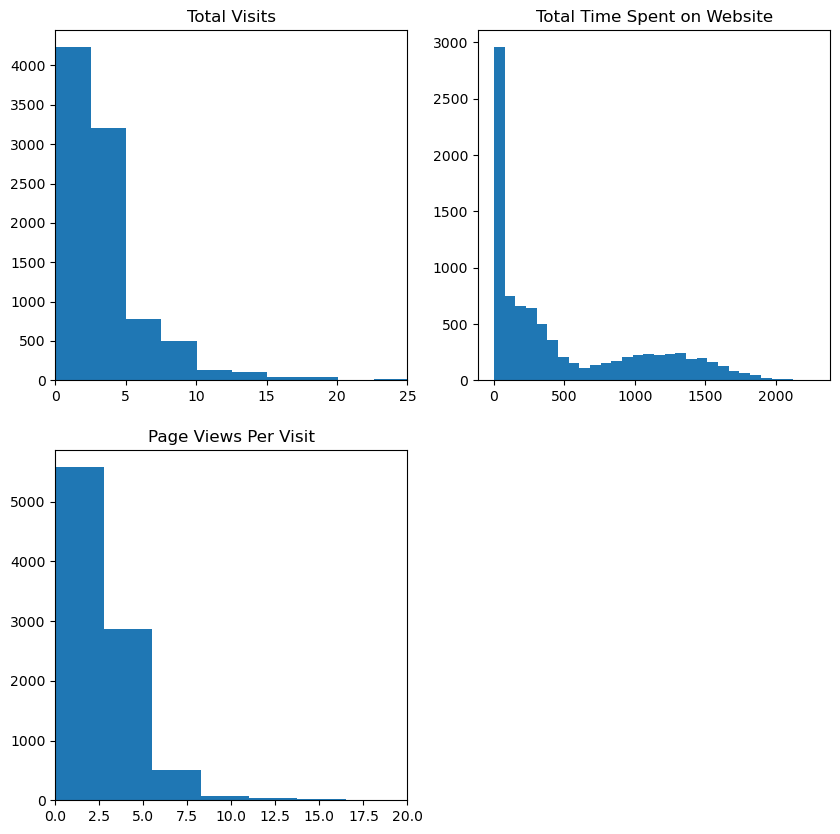

In [26]:
plt.figure(figsize = (10,10))
plt.subplot(221)
plt.hist(dfinal['TotalVisits'], bins = 100)
plt.title('Total Visits')
plt.xlim(0,25)

plt.subplot(222)
plt.hist(dfinal['Total Time Spent on Website'], bins = 30)
plt.title('Total Time Spent on Website')

plt.subplot(223)
plt.hist(dfinal['Page Views Per Visit'], bins = 20)
plt.title('Page Views Per Visit')
plt.xlim(0,20)
plt.show()
    

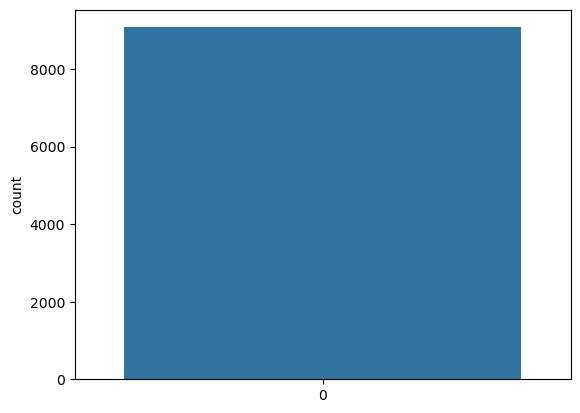

In [27]:
sns.countplot(dfinal['Converted'])
plt.show()

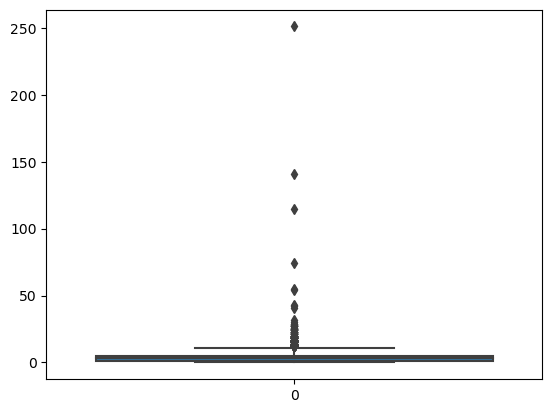

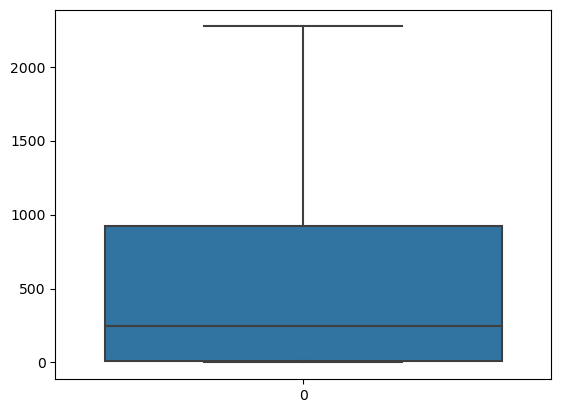

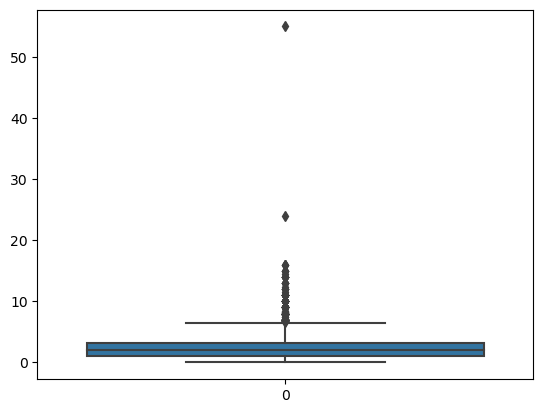

In [28]:
# Checking for Outliers

List1=["TotalVisits","Total Time Spent on Website","Page Views Per Visit"]

for i in List1:
    sns.boxplot(dfinal[i])
    plt.show()

In [29]:
dfp = dfinal[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']]
dfp.describe(percentiles=[0.25,0.5,0.75,0.9,0.99])

,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9074.000000,9074.000000,9074.000000
mean,3.456028,482.887481,2.370151
std,4.858802,545.256560,2.160871
min,0.000000,0.000000,0.000000
25%,1.000000,11.000000,1.000000
50%,3.000000,246.000000,2.000000
75%,5.000000,922.750000,3.200000
90%,7.000000,1373.000000,5.000000
99%,17.000000,1839.000000,9.000000
max,251.000000,2272.000000,55.000000


In [30]:
#No need to remove outliers in 'Total visits' and 'Page views per visit' because it's doesn't effecting mean to large extent.

In [31]:
#Categorical Variables

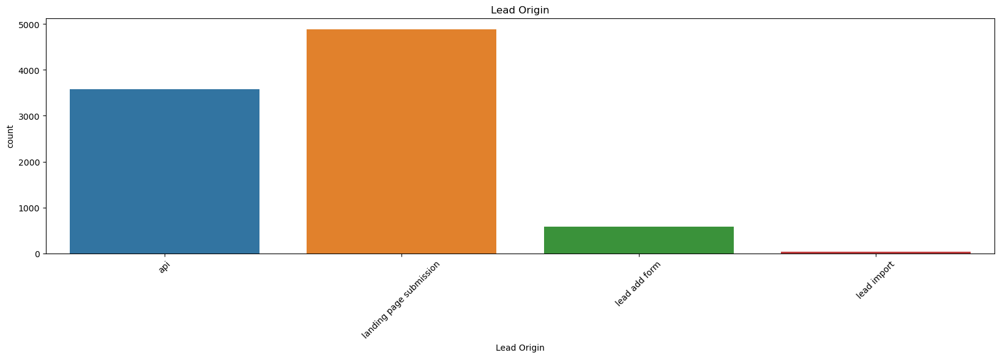

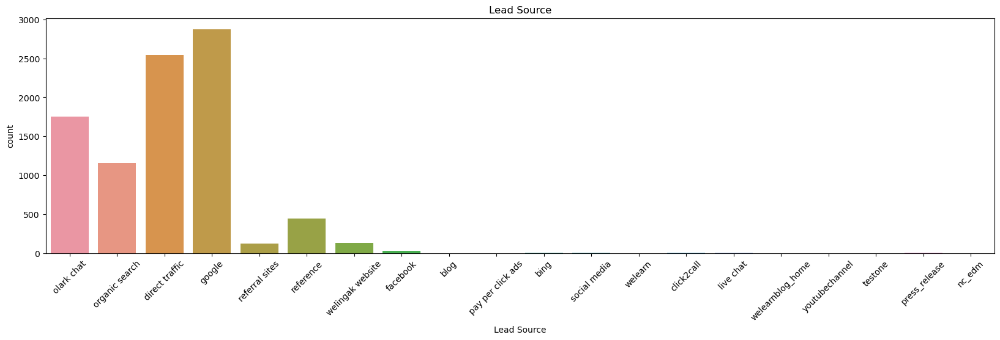

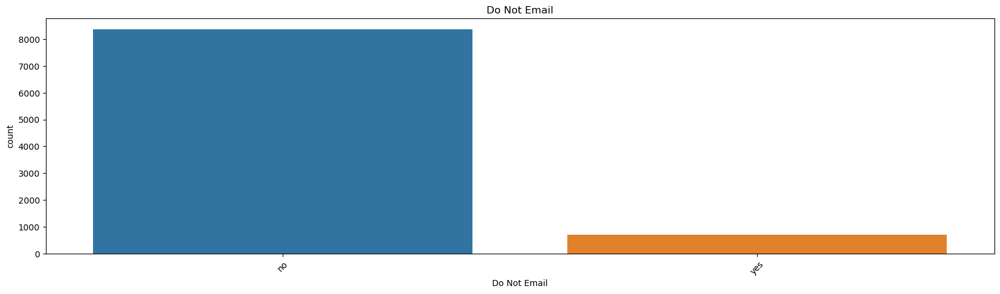

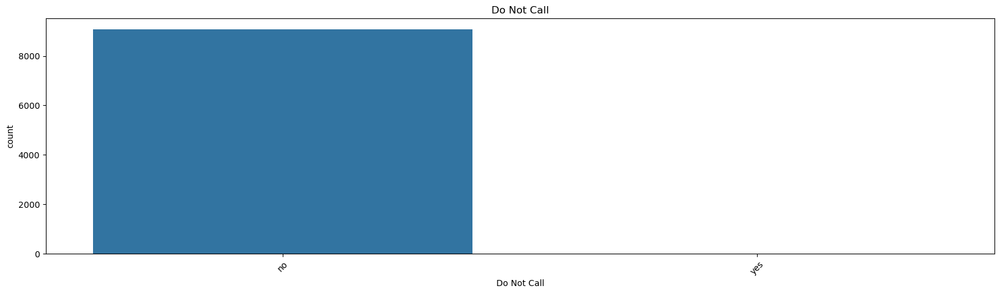

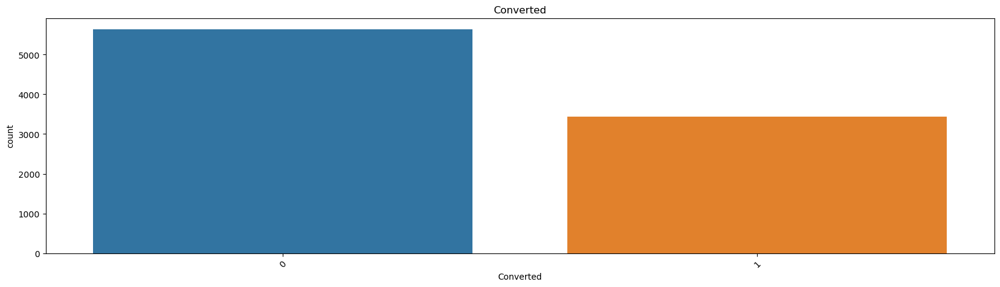

...

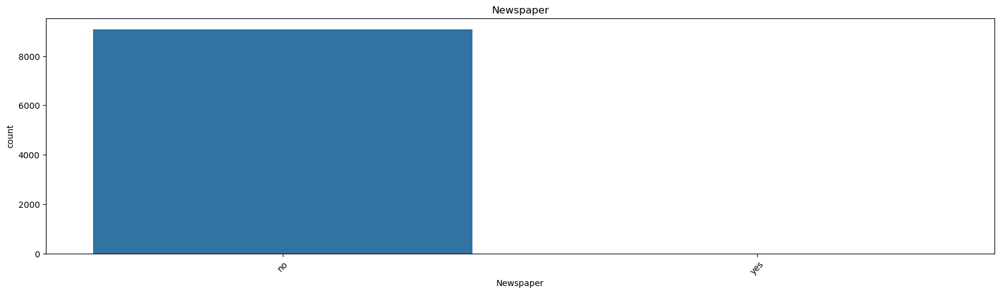

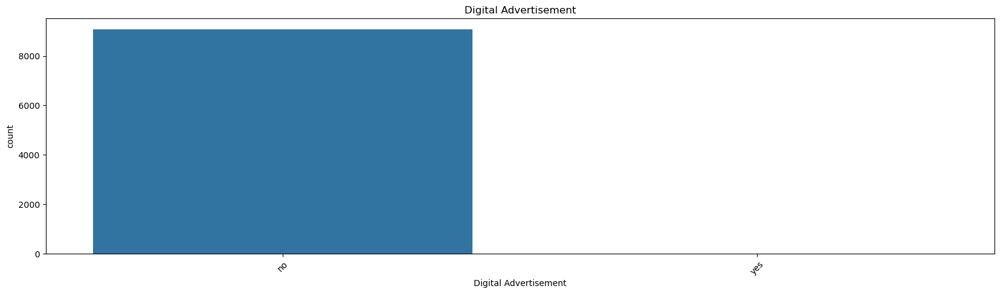

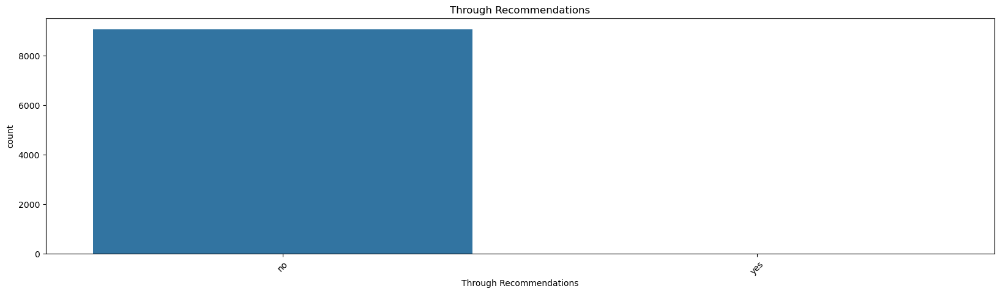

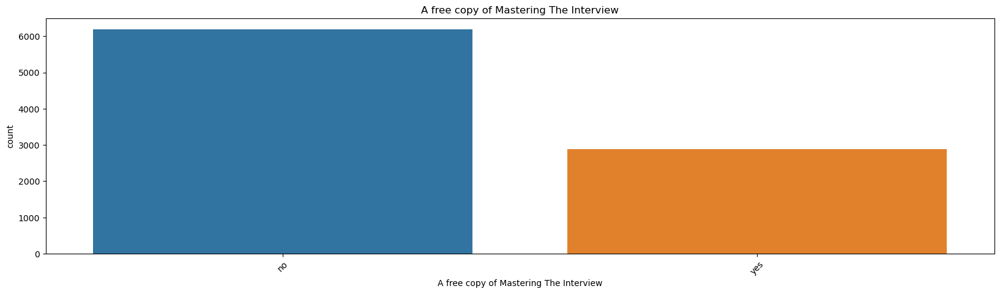

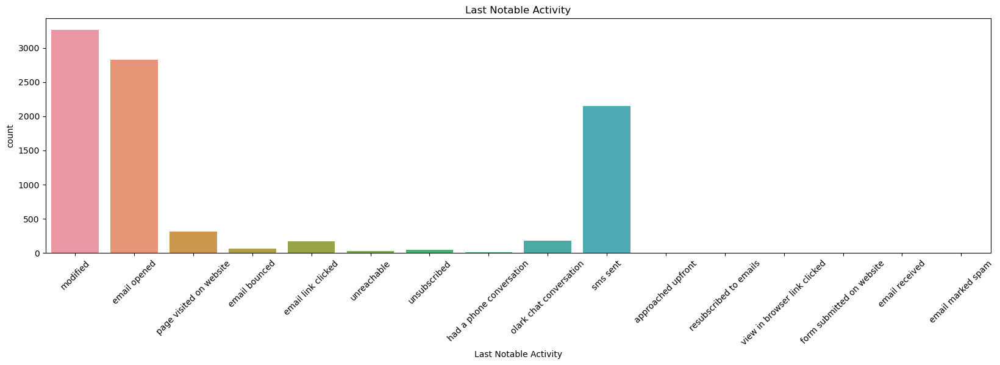

In [32]:
List1=['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call','Converted','Last Activity','Country','Specialization','What is your current occupation','What matters most to you in choosing a course', 'Search','Newspaper Article', 'X Education Forums', 'Newspaper','Digital Advertisement', 'Through Recommendations','A free copy of Mastering The Interview', 'Last Notable Activity']

for i in List1:
    plt.figure(figsize = (20,5))
    sns.countplot(x = dfinal[i]).tick_params(axis='x', rotation = 45)
    plt.title(i)
    plt.show()

In [33]:
#Bivariate Analysis

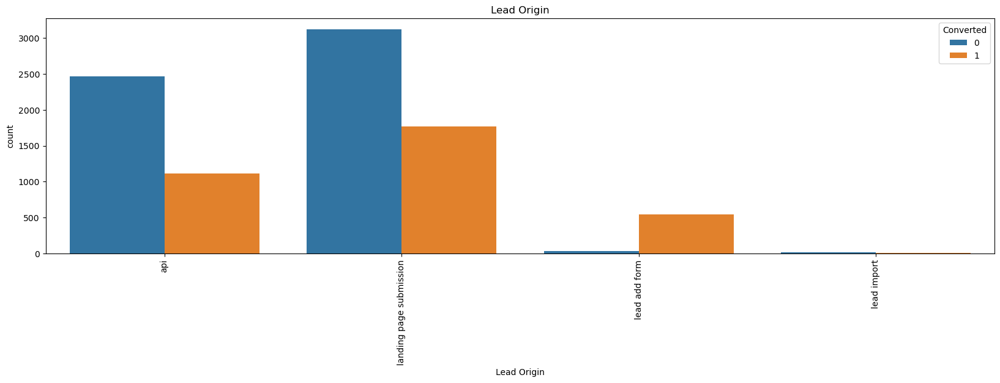

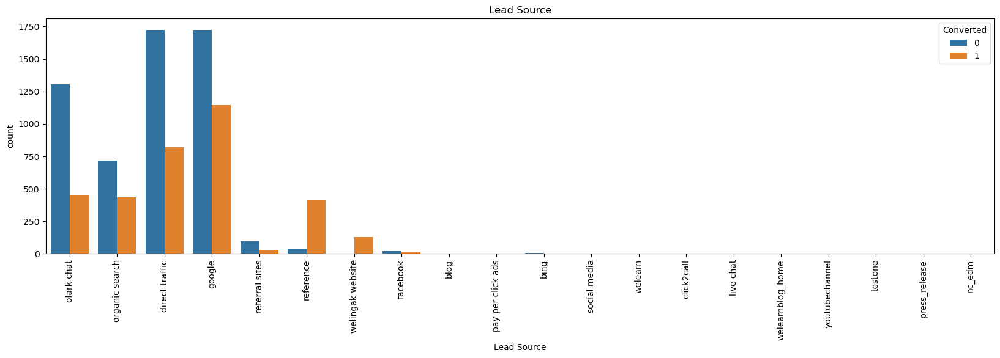

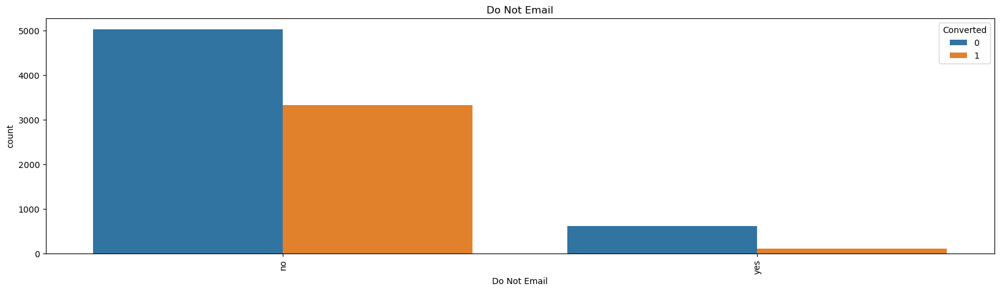

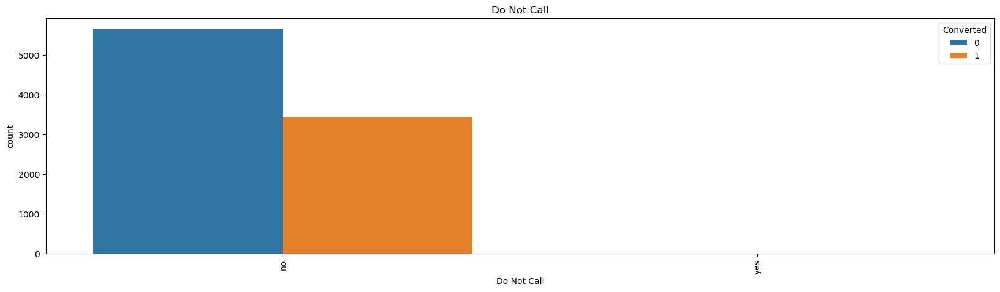

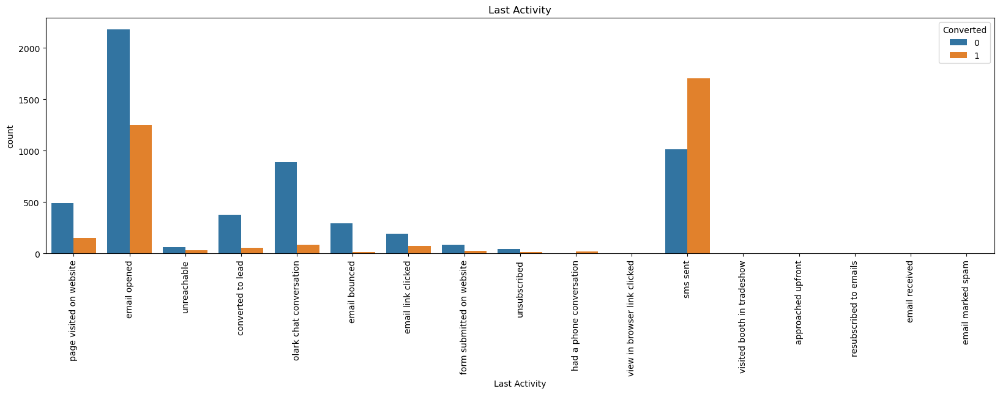

...

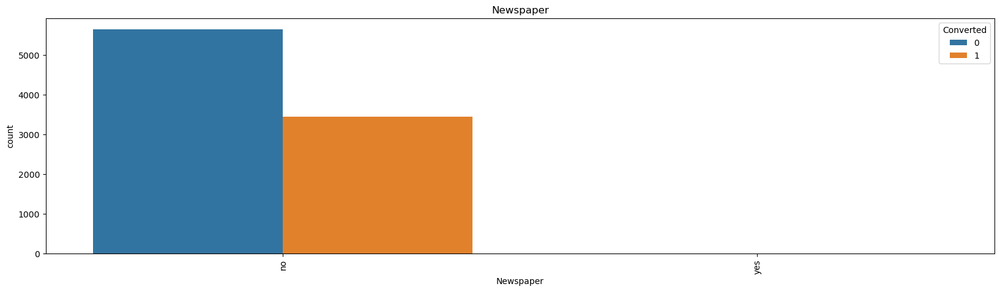

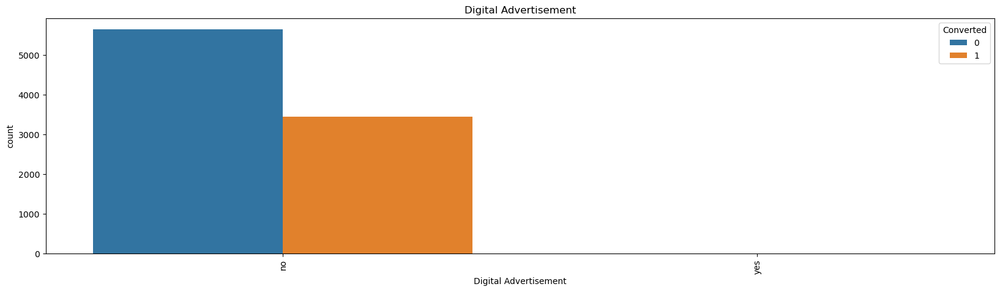

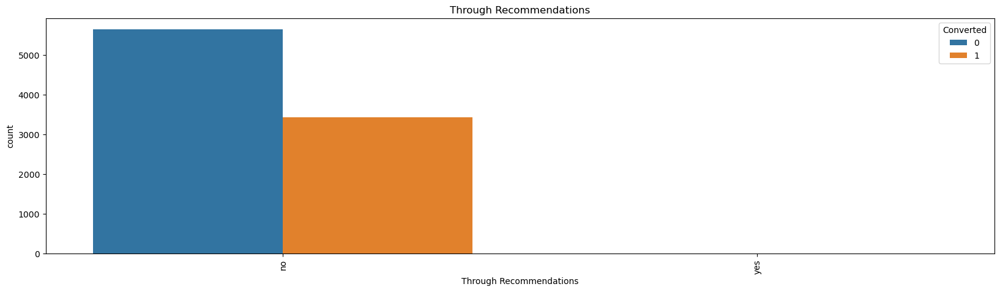

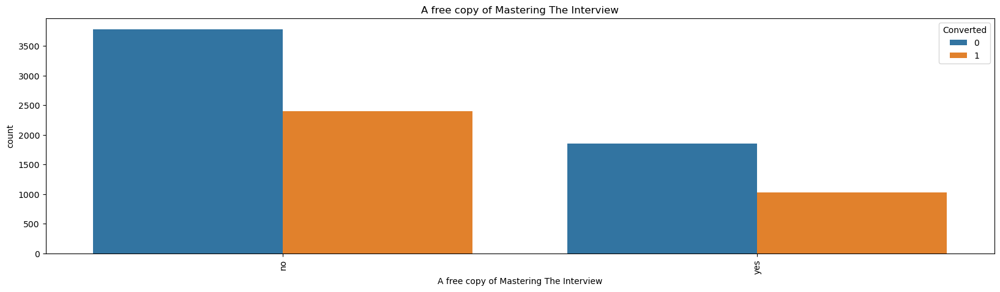

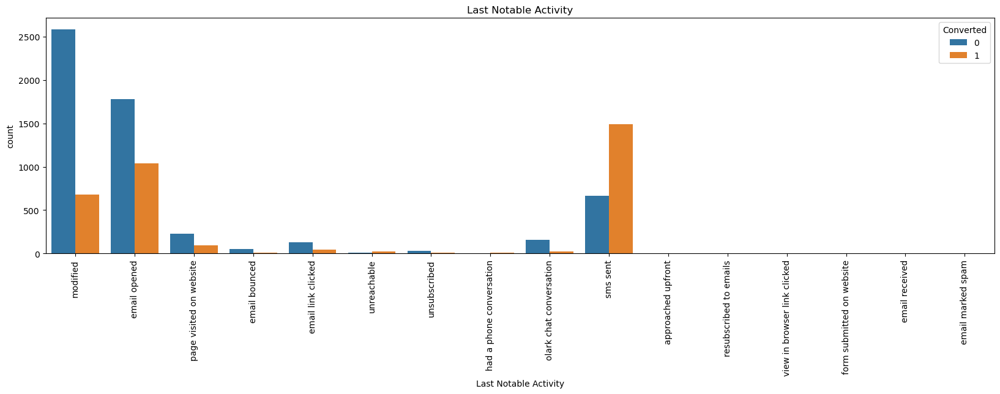

In [34]:
List1=['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call','Last Activity','Country','Specialization','What is your current occupation','What matters most to you in choosing a course', 'Search','Newspaper Article', 'X Education Forums', 'Newspaper','Digital Advertisement', 'Through Recommendations','A free copy of Mastering The Interview', 'Last Notable Activity']

for i in List1:
    plt.figure(figsize = (20,5))
    sns.countplot(x=i, hue='Converted', data= dfinal).tick_params(axis='x', rotation = 90)
    plt.title(i)
    plt.show()

In [35]:
#1.) When we saw lead origin graph, we can observe that lead came through 'Lead Add Form' have more conversion rate.
#2.) In 'Lead Source' graph, we can observe that 'Google', 'Reference' have good conversion.
#3.) In 'Do Not Mail' and 'Do Not Call' graph, we can observe that for input 'No' lead have more conversion.
#4.) In 'Last Activity' graph, for input 'Email Opened' and 'SMS Sent' conversion is good.
#5.) In 'What is your current occupation' graph, for 'Unemployed' and 'Working Professional' conversion is good.
#6.) In 'What matters most to you in choosing a course' graph, for input 'Better Career Prospects' conversion is good.
#7.) In 'Last Notable Activity' graph, for input 'SMS Sent' conversion is good.

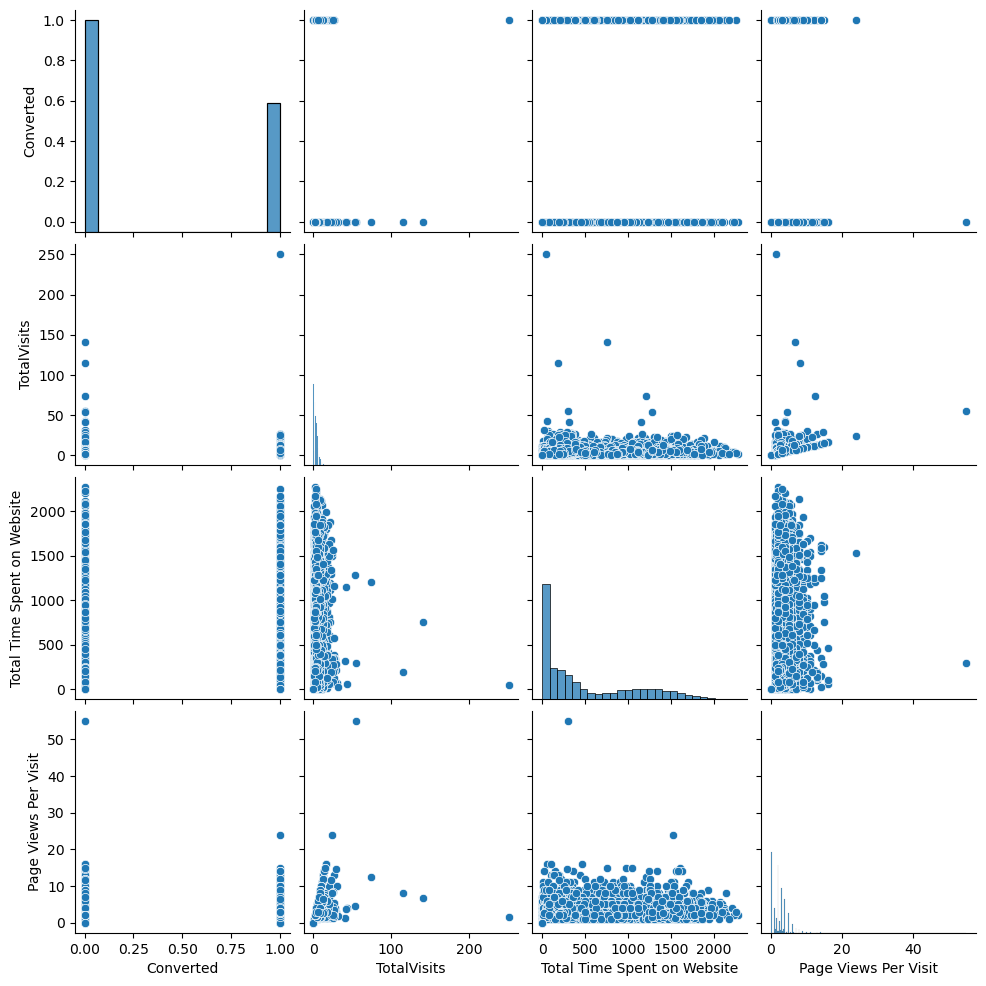

In [36]:
# Checking Corelation between Numerical variables

sns.pairplot(data=dfinal, vars=("Converted","TotalVisits","Total Time Spent on Website","Page Views Per Visit"))
plt.show()

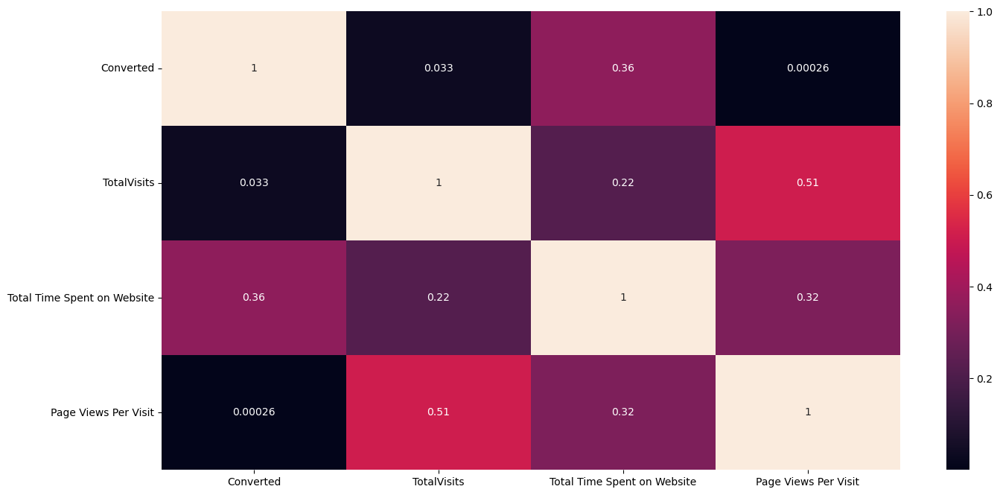

In [37]:
# Heat map

plt.figure(figsize=(16,8))
sns.heatmap(dfinal.corr(), annot=True)
plt.show()

In [38]:
#As we can see through heat map there will be no high correlation, only 'page Views Per Visit' and 'Total Visits' have correlation greater than 0.5

In [39]:
#Creating Dummy Variables

In [40]:
dfinal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9074 entries, 0 to 9239
Data columns (total 21 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9074 non-null   object 
 1   Lead Source                                    9074 non-null   object 
 2   Do Not Email                                   9074 non-null   object 
 3   Do Not Call                                    9074 non-null   object 
 4   Converted                                      9074 non-null   int64  
 5   TotalVisits                                    9074 non-null   float64
 6   Total Time Spent on Website                    9074 non-null   int64  
 7   Page Views Per Visit                           9074 non-null   float64
 8   Last Activity                                  9074 non-null   object 
 9   Country                                        9074 

In [41]:
dfinal.loc[:, dfinal.dtypes == 'object'].columns

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call',
       'Last Activity', 'Country', 'Specialization',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [42]:
# Creating dummy variables

dummy = pd.get_dummies(dfinal[['Lead Origin','Specialization' ,'Lead Source', 'Do Not Email', 'Last Activity', 'What is your current occupation','A free copy of Mastering The Interview', 'Last Notable Activity']], drop_first=True)


In [43]:
# Adding dummy variables to dfinal dataset
dfinal1 = pd.concat([dfinal, dummy], axis=1)
dfinal1.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,...,Last Notable Activity_form submitted on website,Last Notable Activity_had a phone conversation,Last Notable Activity_modified,Last Notable Activity_olark chat conversation,Last Notable Activity_page visited on website,Last Notable Activity_resubscribed to emails,Last Notable Activity_sms sent,Last Notable Activity_unreachable,Last Notable Activity_unsubscribed,Last Notable Activity_view in browser link clicked
0,api,olark chat,no,no,0,0.0,0,0.0,page visited on website,no info,...,0,0,1,0,0,0,0,0,0,0
1,api,organic search,no,no,0,5.0,674,2.5,email opened,outside india,...,0,0,0,0,0,0,0,0,0,0
2,landing page submission,direct traffic,no,no,1,2.0,1532,2.0,email opened,outside india,...,0,0,0,0,0,0,0,0,0,0
3,landing page submission,direct traffic,no,no,0,1.0,305,1.0,unreachable,outside india,...,0,0,1,0,0,0,0,0,0,0
4,landing page submission,google,no,no,1,2.0,1428,1.0,converted to lead,outside india,...,0,0,1,0,0,0,0,0,0,0


In [44]:
dfinal1.columns

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call',
       'Converted', 'TotalVisits', 'Total Time Spent on Website',
       'Page Views Per Visit', 'Last Activity', 'Country', 'Specialization',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'A free copy of Mastering The Interview', 'Last Notable Activity',
       'Lead Origin_landing page submission', 'Lead Origin_lead add form',
       'Lead Origin_lead import', 'Specialization_business administration',
       'Specialization_e-business', 'Specialization_e-commerce',
       'Specialization_finance management',
       'Specialization_healthcare management',
       'Specialization_hospitality management',
       'Specialization_human resource management',
       'Specialization_international business',
       'Specialization_it proje

In [45]:
dfinal1 = dfinal1.drop(['What is your current occupation_no info','Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call','Last Activity', 'Country', 'Specialization', 'Specialization_no info','What is your current occupation','What matters most to you in choosing a course', 'Search','Newspaper Article', 'X Education Forums', 'Newspaper','Digital Advertisement', 'Through Recommendations','A free copy of Mastering The Interview', 'Last Notable Activity'], 1)
dfinal1.head()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_landing page submission,Lead Origin_lead add form,Lead Origin_lead import,Specialization_business administration,Specialization_e-business,Specialization_e-commerce,...,Last Notable Activity_form submitted on website,Last Notable Activity_had a phone conversation,Last Notable Activity_modified,Last Notable Activity_olark chat conversation,Last Notable Activity_page visited on website,Last Notable Activity_resubscribed to emails,Last Notable Activity_sms sent,Last Notable Activity_unreachable,Last Notable Activity_unsubscribed,Last Notable Activity_view in browser link clicked
0,0,0.0,0,0.0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,5.0,674,2.5,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,2.0,1532,2.0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1.0,305,1.0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,1,2.0,1428,1.0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [46]:
# Train-Test Split
X = dfinal1.drop(['Converted'], 1)
y = dfinal1['Converted']
X.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_landing page submission,Lead Origin_lead add form,Lead Origin_lead import,Specialization_business administration,Specialization_e-business,Specialization_e-commerce,Specialization_finance management,...,Last Notable Activity_form submitted on website,Last Notable Activity_had a phone conversation,Last Notable Activity_modified,Last Notable Activity_olark chat conversation,Last Notable Activity_page visited on website,Last Notable Activity_resubscribed to emails,Last Notable Activity_sms sent,Last Notable Activity_unreachable,Last Notable Activity_unsubscribed,Last Notable Activity_view in browser link clicked
0,0.0,0,0.0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,5.0,674,2.5,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2.0,1532,2.0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1.0,305,1.0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,2.0,1428,1.0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [47]:
# Spliting the dataset into 70% and 30% for train and test respectively
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=42)

In [48]:
# Applying Scaler on three numeric features
scaler = MinMaxScaler()
X_train[['TotalVisits', 'Page Views Per Visit', 'Total Time Spent on Website']] = scaler.fit_transform(X_train[['TotalVisits', 'Page Views Per Visit', 'Total Time Spent on Website']])
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_landing page submission,Lead Origin_lead add form,Lead Origin_lead import,Specialization_business administration,Specialization_e-business,Specialization_e-commerce,Specialization_finance management,...,Last Notable Activity_form submitted on website,Last Notable Activity_had a phone conversation,Last Notable Activity_modified,Last Notable Activity_olark chat conversation,Last Notable Activity_page visited on website,Last Notable Activity_resubscribed to emails,Last Notable Activity_sms sent,Last Notable Activity_unreachable,Last Notable Activity_unsubscribed,Last Notable Activity_view in browser link clicked
1943,0.007968,0.629827,0.036364,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
456,0.007968,0.024856,0.036364,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6547,0.019920,0.173546,0.090909,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8836,0.015936,0.730138,0.072727,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6529,0.019920,0.292943,0.090909,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


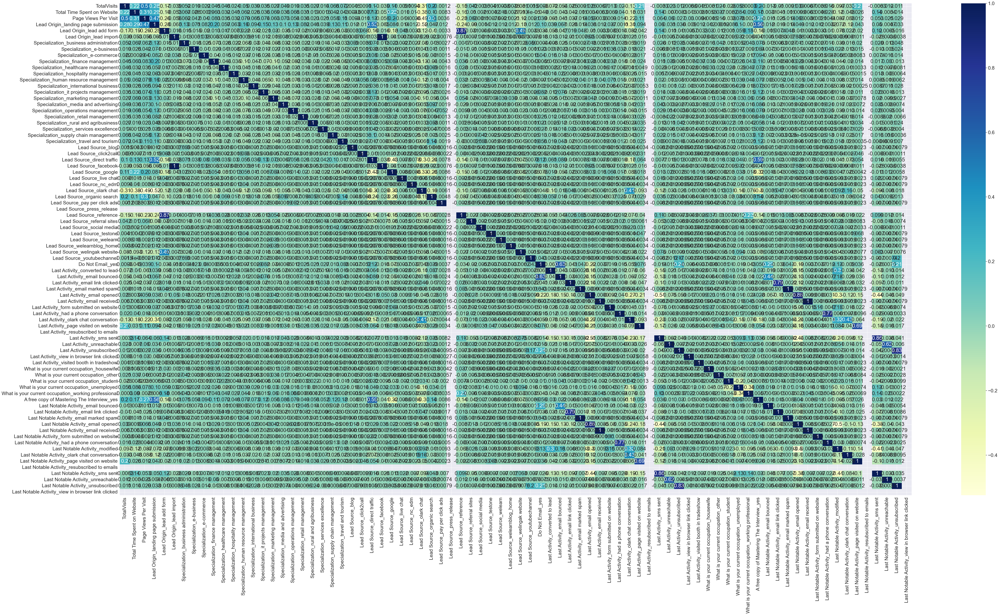

In [49]:
#Checking Correlation

plt.figure(figsize = (80, 40))
sns.set(font_scale=2)
sns.heatmap(X_train.corr(), annot = True, cmap="YlGnBu")

plt.show()

In [50]:
#Lots of variables in data set not able to see correlation properly but some blocks have light blue and dark blue color that means they are highly correlated.

In [51]:
# Building Model

In [52]:
logreg = LogisticRegression()

In [53]:
# Now running RFE with 15 variables

rfe = RFE(estimator=logreg, n_features_to_select=15)
rfe.fit(X_train, y_train) 

RFE(estimator=LogisticRegression(), n_features_to_select=15)

In [54]:
# Features that have been selected by RFE
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('TotalVisits', False, 2),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 8),
 ('Lead Origin_landing page submission', False, 23),
 ('Lead Origin_lead add form', True, 1),
 ('Lead Origin_lead import', False, 62),
 ('Specialization_business administration', False, 25),
 ('Specialization_e-business', False, 38),
 ('Specialization_e-commerce', False, 32),
 ('Specialization_finance management', False, 30),
 ('Specialization_healthcare management', False, 22),
 ('Specialization_hospitality management', False, 55),
 ('Specialization_human resource management', False, 26),
 ('Specialization_international business', False, 31),
 ('Specialization_it projects management', False, 29),
 ('Specialization_marketing management', False, 21),
 ('Specialization_media and advertising', False, 34),
 ('Specialization_operations management', False, 33),
 ('Specialization_retail management', False, 39),
 ('Specialization_rural and agribusiness', False, 16),
 ('Specialization_ser

In [55]:
# columns selected by RFE
col = X_train.columns[rfe.support_]
col

Index(['Total Time Spent on Website', 'Lead Origin_lead add form',
       'Lead Source_direct traffic', 'Lead Source_referral sites',
       'Lead Source_welingak website', 'Do Not Email_yes',
       'Last Activity_converted to lead', 'Last Activity_sms sent',
       'What is your current occupation_housewife',
       'What is your current occupation_other',
       'What is your current occupation_student',
       'What is your current occupation_unemployed',
       'What is your current occupation_working professional',
       'Last Notable Activity_had a phone conversation',
       'Last Notable Activity_unreachable'],
      dtype='object')

In [56]:
X_train.columns[~rfe.support_]

Index(['TotalVisits', 'Page Views Per Visit',
       'Lead Origin_landing page submission', 'Lead Origin_lead import',
       'Specialization_business administration', 'Specialization_e-business',
       'Specialization_e-commerce', 'Specialization_finance management',
       'Specialization_healthcare management',
       'Specialization_hospitality management',
       'Specialization_human resource management',
       'Specialization_international business',
       'Specialization_it projects management',
       'Specialization_marketing management',
       'Specialization_media and advertising',
       'Specialization_operations management',
       'Specialization_retail management',
       'Specialization_rural and agribusiness',
       'Specialization_services excellence',
       'Specialization_supply chain management',
       'Specialization_travel and tourism', 'Lead Source_blog',
       'Lead Source_click2call', 'Lead Source_facebook', 'Lead Source_google',
       'Lead Source_

In [57]:
# Creating dataframe with RFE selected variables

X_train = X_train[col]

In [58]:
# Importing Statsmodel
import statsmodels.api as sm

#Adding Constant variable
X_train_sm = sm.add_constant(X_train)
logm1 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6335
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2645.6
Date:                Tue, 20 Jun 2023   Deviance:                       5291.2
Time:                        16:46:57   Pearson chi2:                 6.33e+03
No. Iterations:                    21   Pseudo R-squ. (CS):             0.3866
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.8932      0.093    -31.220      0.000      -3.075      -2.712
Total Time Spent on Website                              3.9542      0.146     27.094      0.000       3.668       4.240
Lead Origin_lead add form                                2.9546      0.210     14.049      0.000       2.542       3.367
Lead Source_direct traffic                              -0.5318      0.078     -6.797      0.000      -0.685      -0.378
Lead Source_referral sites                              -0.6038      0.319     -1.893      0.058      -1.229       0.021
Lead Source_welingak website                             2.7190      1.030      2.639      0.008       0.700       4.738
Do Not Email_yes                                        -1.5375      0.168     -9.135      0.000      -1.867      -1.208
Last Activity_converted to lead                         -1.2202      0.214     -5.695      0.000      -1.640      -0.800
Last Activity_sms sent                                   1.3281      0.074     18.017      0.000       1.184       1.473
What is your current occupation_housewife               24.0177   1.64e+04      0.001      0.999   -3.21e+04    3.21e+04
What is your current occupation_other                    2.1026      0.630      3.337      0.001       0.868       3.338
What is your current occupation_student                  1.4201      0.222      6.398      0.000       0.985       1.855
What is your current occupation_unemployed               1.2361      0.087     14.174      0.000       1.065       1.407
What is your current occupation_working professional     3.8099      0.206     18.469      0.000       3.406       4.214
Last Notable Activity_had a phone conversation           3.0465      1.154      2.641      0.008       0.786       5.307
Last Notable Activity_unreachable                        2.1114      0.563      3.751      0.000       1.008       3.215
========================================================================================================================
"""

In [59]:
# Importing 'variance_inflation_factor'
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,What is your current occupation_unemployed,2.05
0,Total Time Spent on Website,1.84
1,Lead Origin_lead add form,1.55
7,Last Activity_sms sent,1.51
2,Lead Source_direct traffic,1.43
4,Lead Source_welingak website,1.32
12,What is your current occupation_working profes...,1.28
5,Do Not Email_yes,1.08
6,Last Activity_converted to lead,1.06
10,What is your current occupation_student,1.04


In [60]:
#VIF values are less than 5 for all variable but P values of 'What is your current occupation_Housewife' and 'Last Notable Activity_Had a Phone Conversation' are too much high building model with out them, let first drop one then if needed we drop another.

In [61]:
X_train.drop(['What is your current occupation_housewife'], axis = 1, inplace = True)

In [62]:
# Refit the model
X_train_sm = sm.add_constant(X_train)
logm2 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6336
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2656.0
Date:                Tue, 20 Jun 2023   Deviance:                       5312.1
Time:                        16:46:57   Pearson chi2:                 6.35e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.3846
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.8613      0.092    -31.218      0.000      -3.041      -2.682
Total Time Spent on Website                              3.9558      0.146     27.155      0.000       3.670       4.241
Lead Origin_lead add form                                2.9931      0.210     14.220      0.000       2.581       3.406
Lead Source_direct traffic                              -0.5313      0.078     -6.802      0.000      -0.684      -0.378
Lead Source_referral sites                              -0.6094      0.318     -1.914      0.056      -1.234       0.015
Lead Source_welingak website                             2.6825      1.030      2.604      0.009       0.663       4.702
Do Not Email_yes                                        -1.5421      0.168     -9.165      0.000      -1.872      -1.212
Last Activity_converted to lead                         -1.2276      0.214     -5.733      0.000      -1.647      -0.808
Last Activity_sms sent                                   1.3185      0.074     17.916      0.000       1.174       1.463
What is your current occupation_other                    2.0704      0.630      3.286      0.001       0.836       3.305
What is your current occupation_student                  1.3875      0.222      6.259      0.000       0.953       1.822
What is your current occupation_unemployed               1.2062      0.086     13.963      0.000       1.037       1.375
What is your current occupation_working professional     3.7796      0.206     18.354      0.000       3.376       4.183
Last Notable Activity_had a phone conversation           3.0351      1.152      2.634      0.008       0.777       5.293
Last Notable Activity_unreachable                        2.0959      0.562      3.732      0.000       0.995       3.197
========================================================================================================================
"""

In [63]:
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,What is your current occupation_unemployed,2.05
0,Total Time Spent on Website,1.84
1,Lead Origin_lead add form,1.54
7,Last Activity_sms sent,1.51
2,Lead Source_direct traffic,1.43
4,Lead Source_welingak website,1.32
11,What is your current occupation_working profes...,1.28
5,Do Not Email_yes,1.08
6,Last Activity_converted to lead,1.06
9,What is your current occupation_student,1.04


In [64]:
#Need to drop 'Last Notable Activity_Had a Phone Conversation' as p value is high.

In [65]:
# Creating Prediction

In [66]:
# Predicting the probabilities on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:13]

array([0.57566952, 0.03316833, 0.45477097, 0.77435886, 0.96756572,
       0.39983523, 0.25231676, 0.61189377, 0.03455642, 0.90789756,
       0.16041191, 0.01565937, 0.99467415])

In [67]:
#conversion rate and probablity of predicted ones
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Conversion_Prob':y_train_pred})
y_train_pred_final.head()

,Converted,Conversion_Prob
0,0,0.575670
1,0,0.033168
2,0,0.454771
3,0,0.774359
4,1,0.967566


In [68]:
# using lambda function to assign 0 if Conversion_prob less than 0.5 and 1 Conversion_prob Greater than 0.5 in new column Predicted

y_train_pred_final['Predicted'] = y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted
0,0,0.575670,1
1,0,0.033168,0
2,0,0.454771,0
3,0,0.774359,1
4,1,0.967566,1


In [69]:
#Evaluating Model
# Importing metrics from sklearn for evaluation
from sklearn import metrics

In [70]:
# Creating confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
confusion

array([[3527,  450],
       [ 792, 1582]], dtype=int64)

In [71]:

#81% Overall Accuracy

In [72]:
# true positive
TP = confusion[1,1]
# true negatives
TN = confusion[0,0]
# false positives
FP = confusion[0,1] 
# false negatives
FN = confusion[1,0]

In [73]:
# specificity
TN/(TN+FP)

0.8868493839577571

In [74]:
# sensitivity
TP/(TP+FN)

0.6663858466722831

In [75]:
#Currently on 0.5 cut off we have around 81% accuracy, sensitivity of around 69.5% and specificity of around 88%

In [76]:
#ROC Curve for Optimum Cut off value

In [77]:
# ROC function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(7, 7))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [78]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob, drop_intermediate = False )

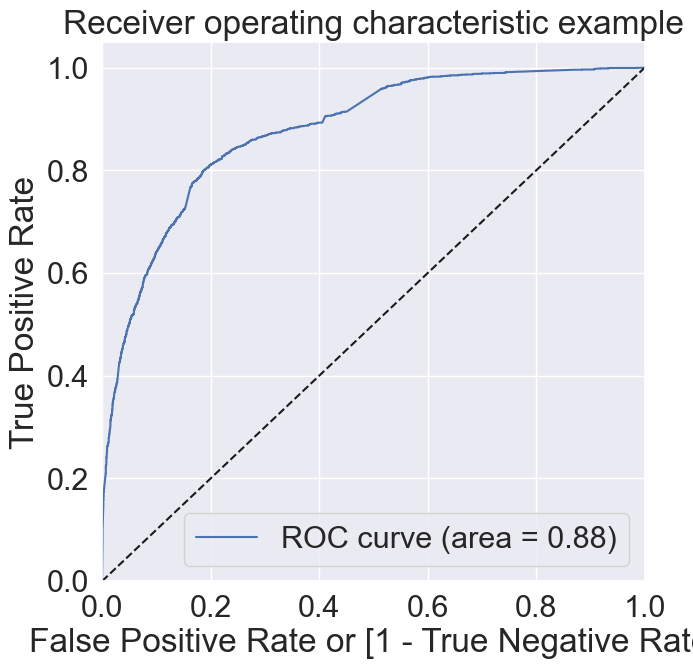

In [79]:
# Call the ROC function
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

In [80]:
#Area under ROC Curve is 0.87.

In [81]:
# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.575670,1,1,1,1,1,1,1,0,0,0,0
1,0,0.033168,0,1,0,0,0,0,0,0,0,0,0
2,0,0.454771,0,1,1,1,1,1,0,0,0,0,0
3,0,0.774359,1,1,1,1,1,1,1,1,1,0,0
4,1,0.967566,1,1,1,1,1,1,1,1,1,1,1


In [82]:
# Creating a dataframe to see the values of accuracy, sensitivity, and specificity at different values of probabiity cutoffs
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
# Making confusing matrix to find values of sensitivity, accurace and specificity for each level of probablity
from sklearn.metrics import confusion_matrix
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
cutoff_df

,prob,accuracy,sensi,speci
0.0,0.0,0.373799,1.000000,0.000000
0.1,0.1,0.605574,0.982730,0.380438
0.2,0.2,0.741458,0.879107,0.659291
0.3,0.3,0.794048,0.831087,0.771939
0.4,0.4,0.810738,0.777591,0.830526
0.5,0.5,0.804440,0.666386,0.886849
0.6,0.6,0.797827,0.588880,0.922555
0.7,0.7,0.783184,0.505476,0.948956
0.8,0.8,0.753267,0.384162,0.973598
0.9,0.9,0.719099,0.265796,0.989691


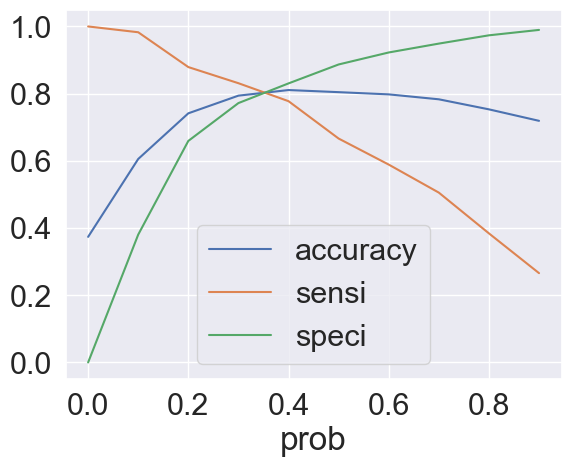

In [83]:
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

In [84]:
#From Graph we can say thay optimal cut off is around 0.35

In [85]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Conversion_Prob.map( lambda x: 1 if x > 0.35 else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.575670,1,1,1,1,1,1,1,0,0,0,0,1
1,0,0.033168,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.454771,0,1,1,1,1,1,0,0,0,0,0,1
3,0,0.774359,1,1,1,1,1,1,1,1,1,0,0,1
4,1,0.967566,1,1,1,1,1,1,1,1,1,1,1,1


In [86]:
# Check the overall accuracy
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8063297118564006

In [87]:
# Creating confusion matrix 
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[3210,  767],
       [ 463, 1911]], dtype=int64)

In [88]:
# true positive
TP = confusion2[1,1]
# true negatives
TN = confusion2[0,0]
# false positives
FP = confusion2[0,1] 
# false negatives
FN = confusion2[1,0]

In [89]:
# specificity
TN/(TN+FP)

0.8071410611013327

In [90]:
# sensitivity
TP/(TP+FN)

0.8049705139005897

In [91]:
#Now at cut off 0.35 we have accuracy 80.3%, specifity 80.2%, Senstivity 80.3%

In [92]:
#Prediction on test set

In [93]:
# Scaling numeric values
X_test[['TotalVisits', 'Page Views Per Visit', 'Total Time Spent on Website']] = scaler.transform(X_test[['TotalVisits', 'Page Views Per Visit', 'Total Time Spent on Website']])

In [94]:
# Substituting columns in the final train model
col = X_train.columns

In [95]:
# Select the columns in X_train for X_test as well
X_test = X_test[col]
# Add a constant to X_test
X_test_sm = sm.add_constant(X_test[col])
X_test_sm

,const,Total Time Spent on Website,Lead Origin_lead add form,Lead Source_direct traffic,Lead Source_referral sites,Lead Source_welingak website,Do Not Email_yes,Last Activity_converted to lead,Last Activity_sms sent,What is your current occupation_other,What is your current occupation_student,What is your current occupation_unemployed,What is your current occupation_working professional,Last Notable Activity_had a phone conversation,Last Notable Activity_unreachable
465,1.0,0.155792,0,0,0,0,0,0,0,0,0,0,0,0,0
5424,1.0,0.304039,0,0,0,0,0,0,0,0,0,1,0,0,0
3503,1.0,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0
4465,1.0,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0
5394,1.0,0.072792,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3436,1.0,0.318242,0,0,0,0,0,0,0,0,0,1,0,0,0
1621,1.0,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0
7665,1.0,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0
7274,1.0,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0


In [96]:
# Storing prediction of test set in the variable 'y_test_pred'
y_test_pred = res.predict(X_test_sm)
# Coverting it to df
y_pred_df = pd.DataFrame(y_test_pred)
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
# Remove index for both dataframes to append them side by side 
y_pred_df.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)
# Append y_test_df and y_pred_df
y_pred_final = pd.concat([y_test_df, y_pred_df],axis=1)
# Renaming column 
y_pred_final= y_pred_final.rename(columns = {0 : 'Conversion_Prob'})
y_pred_final.head()

,Converted,Conversion_Prob
0,0,0.095778
1,0,0.388777
2,0,0.160412
3,0,0.160412
4,0,0.070872


In [97]:
# Making prediction using cut off 0.35
y_pred_final['final_predicted'] = y_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.35 else 0)
y_pred_final

,Converted,Conversion_Prob,final_predicted
0,0,0.095778,0
1,0,0.388777,1
2,0,0.160412,0
3,0,0.160412,0
4,0,0.070872,0
...,...,...,...
2718,1,0.402208,1
2719,0,0.054099,0
2720,0,0.160412,0
2721,0,0.054099,0


In [98]:
# Check the overall accuracy
metrics.accuracy_score(y_pred_final['Converted'], y_pred_final.final_predicted)

0.7980168931325744

In [99]:
# Creating confusion matrix 
confusion3 = metrics.confusion_matrix(y_pred_final['Converted'], y_pred_final.final_predicted )
confusion3

array([[1325,  337],
       [ 213,  848]], dtype=int64)

In [100]:
# true positive
TP = confusion3[1,1]
# true negatives
TN = confusion3[0,0]
# false positives
FP = confusion3[0,1] 
# false negatives
FN = confusion3[1,0]

In [101]:
# specificity
TN/(TN+FP)

0.7972322503008423

In [102]:
# sensitivity
TP/(TP+FN)

0.7992459943449576

In [103]:
#for test set also at cut off 0.35 we have accuracy 80.7%, senstivity 81%, specificity 80.5%

In [104]:
#Precision and Recall

In [105]:
confusion4 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
confusion4

array([[3527,  450],
       [ 792, 1582]], dtype=int64)

In [106]:
# true positive
TP = confusion4[1,1]
# true negatives
TN = confusion4[0,0]
# false positives
FP = confusion4[0,1] 
# false negatives
FN = confusion4[1,0]

In [107]:
# Precision 
TP/(TP + FP)

0.7785433070866141

In [108]:
#Recall
TP/(TP + FN)

0.6663858466722831

In [109]:
#At current cut off 0.35 we have Precision around 78.8% and Recall around 69.5%

In [110]:
#ROC Curve for Optimum Cut off value for Precision and Recall

In [111]:
from sklearn.metrics import precision_recall_curve

In [112]:
y_train_pred_final.Converted, y_train_pred_final.Predicted

(0       0
 1       0
 2       0
 3       0
 4       1
        ..
 6346    0
 6347    0
 6348    0
 6349    0
 6350    0
 Name: Converted, Length: 6351, dtype: int64,
 0       1
 1       0
 2       0
 3       1
 4       1
        ..
 6346    0
 6347    0
 6348    0
 6349    0
 6350    0
 Name: Predicted, Length: 6351, dtype: int64)

In [113]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

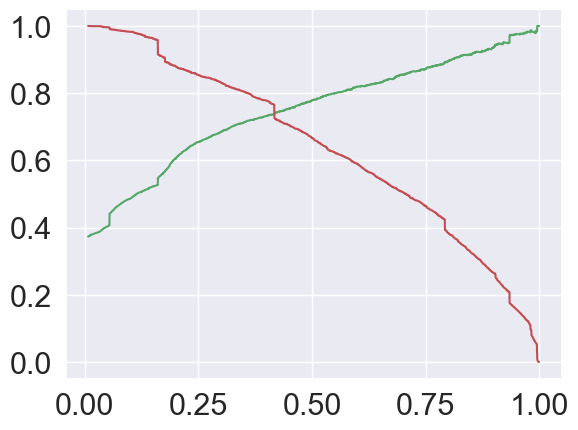

In [114]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [115]:
# From graph we can see optimum cut off is around 0.41.

In [116]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.41 else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.575670,1,1,1,1,1,1,1,0,0,0,0,1
1,0,0.033168,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.454771,0,1,1,1,1,1,0,0,0,0,0,1
3,0,0.774359,1,1,1,1,1,1,1,1,1,0,0,1
4,1,0.967566,1,1,1,1,1,1,1,1,1,1,1,1


In [117]:
# Accuracy
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8104235553456148

In [118]:
# Creating confusion matrix again
confusion5 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion5

array([[3321,  656],
       [ 548, 1826]], dtype=int64)

In [119]:
# true positive
TP = confusion5[1,1]
# true negatives
TN = confusion5[0,0]
# false positives
FP = confusion5[0,1] 
# false negatives
FN = confusion5[1,0]

In [120]:
# Precision
TP / (TP + FP)

0.7356970185334408

In [121]:
#Recall
TP / (TP + FN)

0.7691659646166807

In [122]:
#At cut off 0.41 we have accuracy 81% Precision around 75.4% and Recall around 75.8%

In [123]:
#Prediction on test set

In [124]:
# Storing prediction of test set in the variable 'y_test_pred'
y_test_pred = res.predict(X_test_sm)
# Coverting it to df
y_pred_df = pd.DataFrame(y_test_pred)
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
# Remove index for both dataframes to append them side by side 
y_pred_df.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)
# Append y_test_df and y_pred_df
y_pred_final = pd.concat([y_test_df, y_pred_df],axis=1)
# Renaming column 
y_pred_final= y_pred_final.rename(columns = {0 : 'Conversion_Prob'})
y_pred_final.head()

,Converted,Conversion_Prob
0,0,0.095778
1,0,0.388777
2,0,0.160412
3,0,0.160412
4,0,0.070872


In [125]:
# Making prediction using cut off 0.41
y_pred_final['final_predicted'] = y_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.41 else 0)
y_pred_final

,Converted,Conversion_Prob,final_predicted
0,0,0.095778,0
1,0,0.388777,0
2,0,0.160412,0
3,0,0.160412,0
4,0,0.070872,0
...,...,...,...
2718,1,0.402208,0
2719,0,0.054099,0
2720,0,0.160412,0
2721,0,0.054099,0


In [126]:
# Check the overall accuracy
metrics.accuracy_score(y_pred_final['Converted'], y_pred_final.final_predicted)

0.8005875872199779

In [127]:
# Creating confusion matrix 
confusion6 = metrics.confusion_matrix(y_pred_final['Converted'], y_pred_final.final_predicted )
confusion6

array([[1365,  297],
       [ 246,  815]], dtype=int64)

In [128]:
# true positive
TP = confusion6[1,1]
# true negatives
TN = confusion6[0,0]
# false positives
FP = confusion6[0,1] 
# false negatives
FN = confusion6[1,0]

In [129]:
# Precision
TP / (TP + FP)

0.7329136690647482

In [130]:
#Recall
TP / (TP + FN)

0.7681432610744581

In [131]:
#At current cut off 0.41 we have Precision around 73.2% and Recall around 76.6%

In [132]:
# Conclusion
#It was found that the variables that mattered the most in the potential buyers are: 
#1. The total time spend on the Website. 
#2. Total number of visits. 
#3. When the lead source was Welingak website, Olark chat, Organic search & Google
#4. When the last activity was SMS sent and Olark chat conversation
# 5. When the lead origin was 'Lead add form'
# 6. When their current occupation is working professional or unemployed.
# Keeping these insights in mind X Education can flourish as they have a very high chance to get almost all the potential buyers to change their mind and buy their courses.